# Основная информация

#### Представлены реальные больничные данные с антропометрическими и поведенческими особенностями людей. Необходимо построить модель машинного обучения, которая с большой вероятностью будет предсказывать риск сердечно-сосудистых заболеваний у пациента.

## Небольшая информация о данных


Представлено 3 вида входящих признаков:

Objective: фактическая информация;

Examination: Результаты медицинского освидетельствования;

Subjective: Информация из уст пациента.

Признаки:

1. Age | Objective Feature | age | int (days)
2. Height | Objective Feature | height | int (cm) |
3. Weight | Objective Feature | weight | float (kg) |
4. Gender | Objective Feature | gender | categorical code |
5. Systolic blood pressure | Examination Feature | ap_hi | int |
6. Diastolic blood pressure | Examination Feature | ap_lo | int |
7. Cholesterol | Examination Feature | cholesterol | 1: normal, 2: above normal, 3: well above normal |
8. Glucose | Examination Feature | gluc | 1: normal, 2: above normal, 3: well above normal |
9. Smoking | Subjective Feature | smoke | binary |
10. Alcohol intake | Subjective Feature | alco | binary |
11. Physical activity | Subjective Feature | active | binary |
12. Presence or absence of cardiovascular disease | Target Variable | cardio | binary |

Все данные были собраны в момент медицинского освидетельствования

In [69]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe, space_eval
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier, VotingClassifier 
sns.set();

In [3]:
df = pd.read_csv('data/cardio_train.csv', sep=';', index_col=0)

df

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
id,,,,,,,,,,,,
0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,17474,1,156,56.0,100,60,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
99993,19240,2,168,76.0,120,80,1,1,1,0,1,0
99995,22601,1,158,126.0,140,90,2,2,0,0,1,1
99996,19066,2,183,105.0,180,90,3,1,0,1,0,1


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 70000 entries, 0 to 99999
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          70000 non-null  int64  
 1   gender       70000 non-null  int64  
 2   height       70000 non-null  int64  
 3   weight       70000 non-null  float64
 4   ap_hi        70000 non-null  int64  
 5   ap_lo        70000 non-null  int64  
 6   cholesterol  70000 non-null  int64  
 7   gluc         70000 non-null  int64  
 8   smoke        70000 non-null  int64  
 9   alco         70000 non-null  int64  
 10  active       70000 non-null  int64  
 11  cardio       70000 non-null  int64  
dtypes: float64(1), int64(11)
memory usage: 6.9 MB


### Анализ корреляций числовых признаков
Выделим числовые признаки в отдельную группу и рассмотрим некоторые простейшие виды корреляционного анализа таких данных.

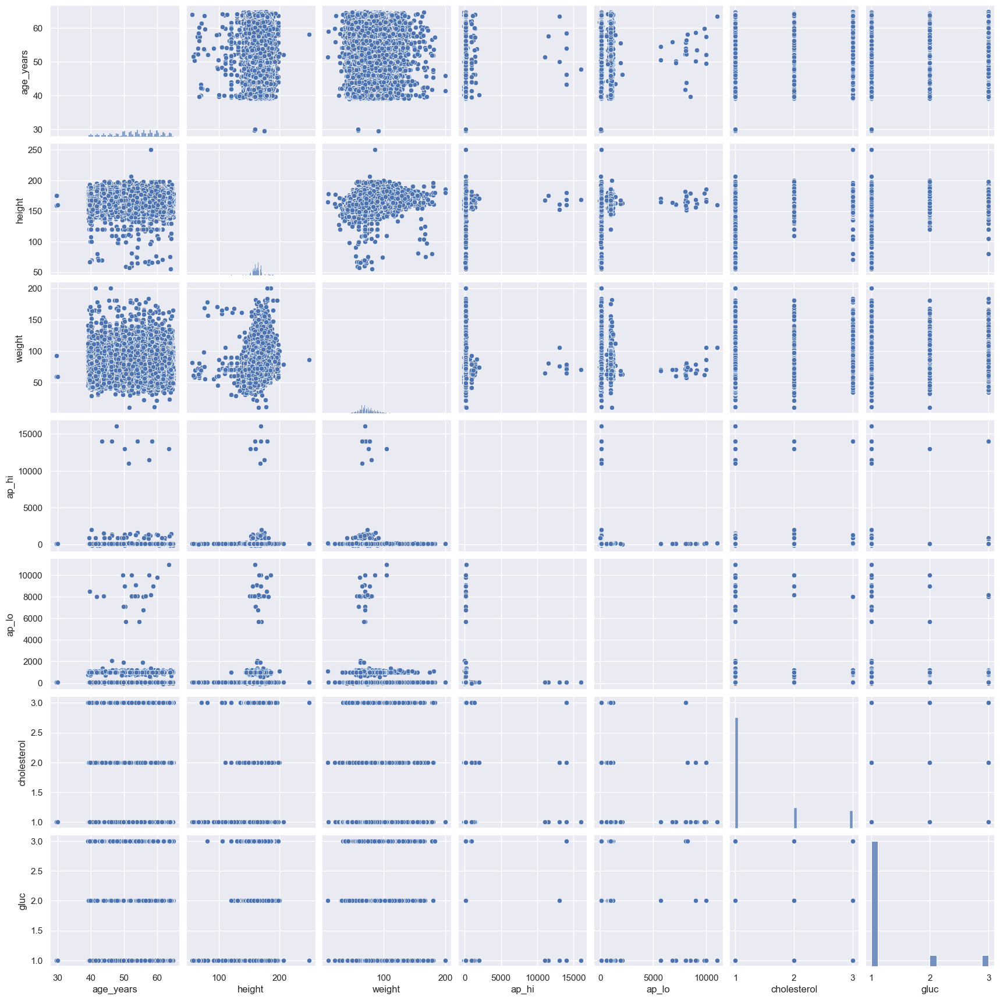

In [5]:
df['age_years'] = df['age'] / 365.25 # возраст в годах
numeric = ['age_years', 'height', 'weight', 'ap_hi', 'ap_lo', 'cholesterol', 'gluc']
sns.pairplot(df[numeric]);

### Посмотрим детальнее на выбросы

In [12]:
display(px.box(df['age_years'], width=500, orientation='h'))

In [14]:
display(px.box(df['height'], width=700, orientation='h'))

In [16]:
display(px.box(df['weight'], width=700, orientation='h'))

In [18]:
display(px.box(df['ap_hi'], width=1000, orientation='h'))

In [19]:
display(px.box(df['ap_lo'], width=1000, orientation='h'))

In [20]:
def outliers_indices(feature):
    '''
    Будем считать выбросами все точки, выходящие за пределы трёх сигм.
    '''
    mid = df[feature].mean()
    sigma = df[feature].std()
    return df[(df[feature] < mid - 3*sigma) | (df[feature] > mid + 3*sigma)].index

In [21]:
wrong_height = outliers_indices('height')
wrong_weight = outliers_indices('weight')
wrong_hi = outliers_indices('ap_hi')
wrong_lo = outliers_indices('ap_lo')

out = set(wrong_height) | set(wrong_weight) | set(wrong_hi) | set(wrong_lo)

print(len(out))

1929


#### Из набора данных будет удалено 1929 объектов-выбросов, что не является существенным в данном случае.

In [22]:
df.drop(out, inplace=True)

#### Построим матрицу корреляций Спирмена для числовых признаков без учёта объектов-выбросов.

In [23]:
df[numeric].corr(method='spearman')

,age_years,height,weight,ap_hi,ap_lo,cholesterol,gluc
age_years,1.000000,-0.080755,0.066402,0.223776,0.160284,0.142255,0.092413
height,-0.080755,1.000000,0.312419,0.017144,0.028388,-0.062429,-0.026099
weight,0.066402,0.312419,1.000000,0.269200,0.246267,0.132306,0.103824
ap_hi,0.223776,0.017144,0.269200,1.000000,0.728927,0.205921,0.101733
ap_lo,0.160284,0.028388,0.246267,0.728927,1.000000,0.164351,0.079457
cholesterol,0.142255,-0.062429,0.132306,0.205921,0.164351,1.000000,0.405530
gluc,0.092413,-0.026099,0.103824,0.101733,0.079457,0.405530,1.000000


C:\Users\Администратор\AppData\Local\Temp\ipykernel_18000\3145523776.py:4: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



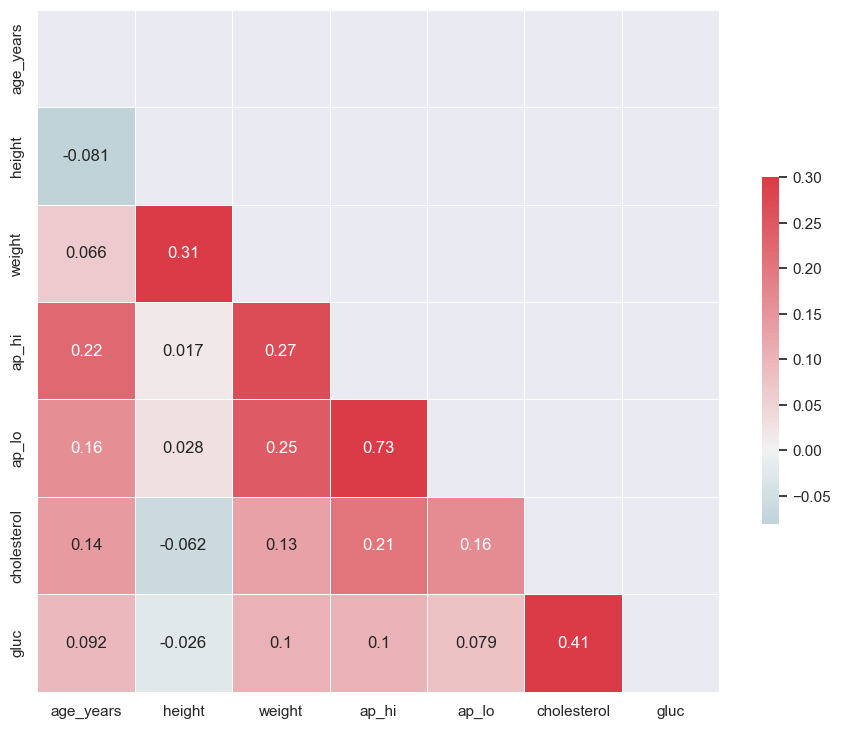

In [24]:
corr = df[numeric].corr(method='spearman')
cmap = sns.diverging_palette(220, 10, as_cmap=True)
# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,annot = True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

#### Наибольшая корреляция наблюдается между переменными ap_hi и ap_lo. Достаточно высокой является корреляция между ростом и весом, а также уровнями холестерина и глюкозы

***

## Статистические тесты


#### Рассмотрим статистическую значимость выявленных взаимосвязей. Иными словами, насколько высокой должна быть степень корреляции, чтобы можно было вообще говорить о какой-либо неслучайной взаимосвязи между признаками

In [25]:
from scipy.stats import pearsonr, spearmanr, kendalltau
r = pearsonr(df['height'], df['weight'])
print('Pearson correlation:', r[0], 'p-value:', r[1])

Pearson correlation: 0.3142873661362599 p-value: 0.0


In [26]:
r = pearsonr(df['cholesterol'], df['weight'])
print('Pearson correlation:', r[0], 'p-value:', r[1])

Pearson correlation: 0.13780051085349537 p-value: 9.348547578451874e-286


In [27]:
r = spearmanr(df['cholesterol'], df['weight'])
print('Spearman correlation:', r[0], 'p-value:', r[1])

Spearman correlation: 0.13230579095093412 p-value: 2.1550632494593984e-263


Так как p-value < 0.05 (дефолтное значение), то делаем вывод о том, что взаимосвязь (корреляция) между ростом и весом статистически значима.

Проверим, действительно ли корреляция роста и давления статистически незначима в отличие от корреляции веса и давления. Снова воспользуемся коэффициентом корреляции Пирсона.

In [28]:
r_height_pressure = pearsonr(df['height'], df['ap_hi'])
print('Height vs. Pressure:', r_height_pressure)
r_weight_pressure = pearsonr(df['weight'], df['ap_hi'])
print('Weight vs. Pressure:', r_weight_pressure)

Height vs. Pressure: PearsonRResult(statistic=0.010717520992153066, pvalue=0.005169536660391454)
Weight vs. Pressure: PearsonRResult(statistic=0.24423383377174285, pvalue=0.0)


Как видим, p-значения в обоих случаях достаточно малы, поэтому у нас нет оснований утверждать, что между ростом и давлением нет статистически подтверждённой взаимосвязи. Тот факт, что значение  r=0.01 оказалось значимым, может быть обусловлен большой длиной выборки.

***

### Анализ корреляций категориальных признаков

Рассмотрим взаимосвязь курения и сердечно-сосудистых заболеваний. Построим кросс-таблицу.

In [29]:
pd.crosstab(df['smoke'], df['cardio'])

cardio,0,1
smoke,,
0,31348,30787
1,3175,2761


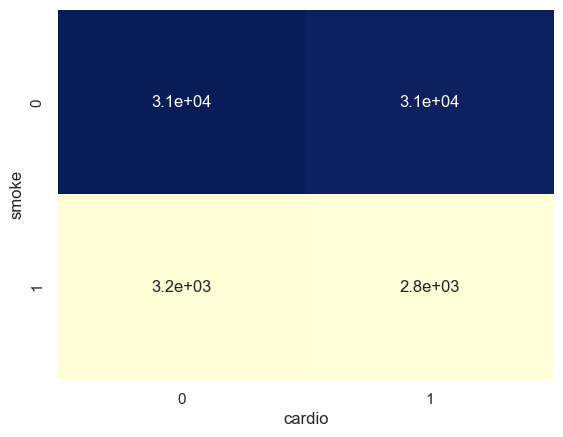

In [31]:
sns.heatmap(pd.crosstab(df['smoke'], df['cardio']), 
            cmap="YlGnBu", annot=True, cbar=False);

#### На этом этапе сложно утверждать что-либо. Попробуем вычислить коэффициент  χ2

In [32]:
from scipy.stats import chi2_contingency, fisher_exact
chi2_contingency(pd.crosstab(df['smoke'], df['cardio']))

(19.85673527332828,
 8.34681250322075e-06,
 1,
 array([[31512.48850465, 30622.51149535],
        [ 3010.51149535,  2925.48850465]]))

#### Малое значение p-value говорит о том, что связь статистически подтверждается. В данном случае у курящих людей склонность с ССЗ (сердечно-сосудистых заболеваний) ниже. Этот же вывод подтверждает тест Фишера.

In [33]:
fisher_exact(pd.crosstab(df['smoke'], df['cardio']))

(0.885452245029283, 7.799832073100421e-06)

***

### Взаимосвязь категориального и числового признаков 


В случае бинарного категориального признака и числового признака мы можем применить бисериальный коэффициент корреляции. Например, рассмотрим взаимосвязь веса и сердечно-сосудистых заболеваний.

In [34]:
from scipy.stats import pointbiserialr
pointbiserialr(df['cardio'], df['weight'])

PointbiserialrResult(correlation=0.17891971905824355, pvalue=0.0)

^ Связь снова подтверждается

#### Создадим классический для подобных датасетов признак - индекс массы тела

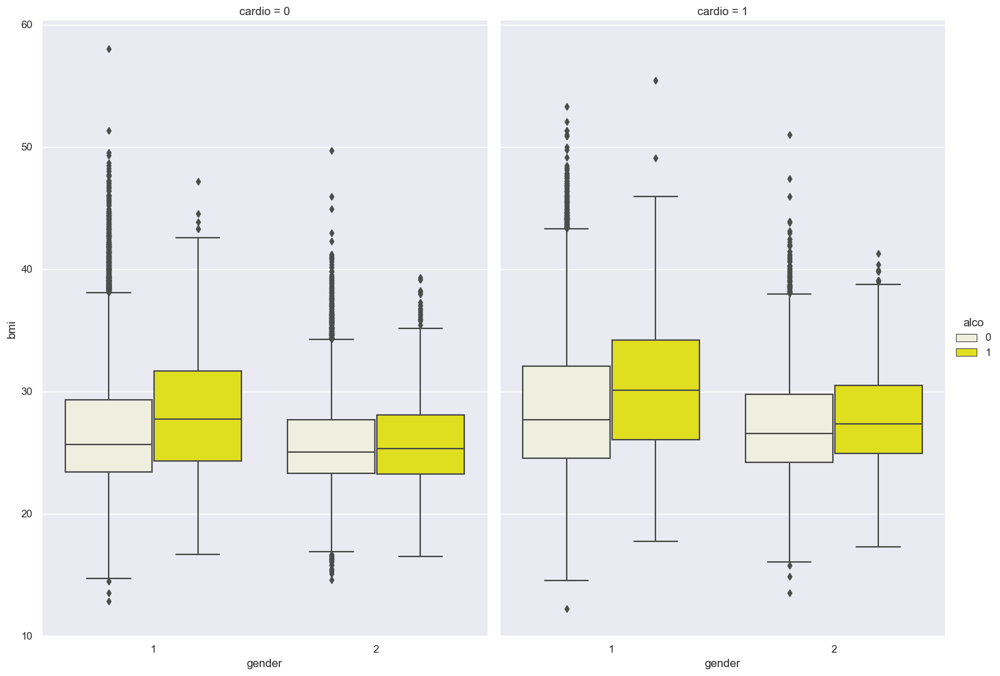

In [35]:
df['bmi'] = df['weight']/((df['height']/100)**2)
sns.catplot(x="gender", y="bmi", hue="alco", col="cardio", data=df, color = "yellow",kind="box", height=10, aspect=.7);

#### Женщины, употребляющие алкоголь более подвержены ССЗ, чем мужчины (женщины - 1, мужчины - 2)

***

### Подготовка к моделированию

<AxesSubplot: >

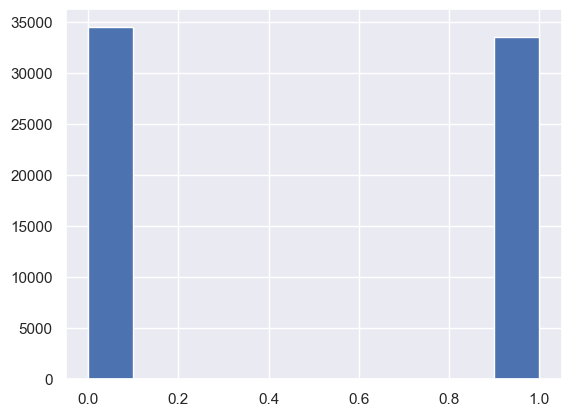

In [42]:
df['cardio'].hist()

Целевой признак сбалансирован. Стратифицированное разбиение не понадобится

In [36]:
target_name = 'cardio'
data_target = df[target_name]
df = df.drop([target_name], axis=1)
df = df.drop(['age_years'], axis=1) # данный признак мультиколлинеарен с базовым возрастом в днях. Обязательно его удаляем

In [39]:
train, test, target, target_test = train_test_split(df, data_target, test_size=0.2, random_state=0)

In [47]:
train.head(3)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,bmi
id,,,,,,,,,,,,
40146,17551,2,174,68.0,120,80,1,1,0,0,1,22.460034
12968,21940,2,160,60.0,120,80,1,1,0,0,1,23.437500
45489,23551,2,173,91.0,160,100,1,1,0,0,1,30.405293


In [48]:
test.head(3)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,bmi
id,,,,,,,,,,,,
19521,15801,1,155,51.0,120,70,1,1,0,0,1,21.227888
68410,18900,1,157,68.0,110,70,1,1,0,0,0,27.587326
38716,19023,1,163,55.0,110,70,1,1,0,0,0,20.700817


In [49]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 54456 entries, 40146 to 63949
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          54456 non-null  int64  
 1   gender       54456 non-null  int64  
 2   height       54456 non-null  int64  
 3   weight       54456 non-null  float64
 4   ap_hi        54456 non-null  int64  
 5   ap_lo        54456 non-null  int64  
 6   cholesterol  54456 non-null  int64  
 7   gluc         54456 non-null  int64  
 8   smoke        54456 non-null  int64  
 9   alco         54456 non-null  int64  
 10  active       54456 non-null  int64  
 11  bmi          54456 non-null  float64
dtypes: float64(2), int64(10)
memory usage: 5.4 MB


In [50]:
# разбиваем тренировочную выборку на валидационную

Xtrain, Xval, Ztrain, Zval = train_test_split(train, target, test_size=0.2, random_state=0)

## BASELINE задачи

#### В качестве бейзлайна возьмем классическую логистическую регрессию

In [52]:
logreg = LogisticRegression()
logreg.fit(train, target)
acc_log = round(logreg.score(train, target) * 100, 2)
acc_log

c:\Users\Администратор\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



71.83

In [53]:
acc_test_log = round(logreg.score(test, target_test) * 100, 2)
acc_test_log

71.97

In [54]:
coeff_df = pd.DataFrame(train.columns.delete(0))
coeff_df.columns = ['Feature']
coeff_df["Correlation"] = pd.Series(logreg.coef_[0])

coeff_df.sort_values(by='Correlation', ascending=False)

,Feature,Correlation
3,ap_hi,0.088477
6,gluc,0.056578
4,ap_lo,0.046371
5,cholesterol,0.026103
1,height,0.012784
7,smoke,0.012214
0,gender,0.000154
8,alco,-0.000144
9,active,-0.001797
10,bmi,-0.014287


### Дерево решений

In [56]:
decision_tree = DecisionTreeClassifier()
decision_tree.fit(train, target)
acc_decision_tree = round(decision_tree.score(train, target) * 100, 2)
acc_decision_tree

99.98

In [57]:
acc_test_decision_tree = round(decision_tree.score(test, target_test) * 100, 2)
acc_test_decision_tree

62.42

# Ансамблевые методы 

### Случайный лес

In [59]:
random_forest = GridSearchCV(estimator=RandomForestClassifier(), param_grid={'n_estimators': [100, 300]}, cv=5).fit(train, target)
random_forest.fit(train, target)
acc_random_forest = round(random_forest.score(train, target) * 100, 2)
print(acc_random_forest,random_forest.best_params_)

99.98 {'n_estimators': 300}


In [60]:
acc_test_random_forest = round(random_forest.score(test, target_test) * 100, 2)
acc_test_random_forest

71.27

### Адаптивный бустинг

In [70]:
def hyperopt_ab_score(params):
    clf = AdaBoostClassifier(**params)
    current_score = cross_val_score(clf, train, target, cv=5).mean()
    print(current_score, params)
    return current_score 
 
space_ab = {
            'n_estimators': hp.choice('n_estimators', range(50, 1000)),
            'learning_rate': hp.quniform('learning_rate', 0, 0.05, 0.0001)       
        }
 
best = fmin(fn=hyperopt_ab_score, space=space_ab, algo=tpe.suggest, max_evals=10)
print('best:')
print(best)

0.7282577588431529                                    
{'learning_rate': 0.0455, 'n_estimators': 898}        
0.7271559619941776                                                               
{'learning_rate': 0.046200000000000005, 'n_estimators': 472}                     
0.7121713161227404                                                               
{'learning_rate': 0.0036000000000000003, 'n_estimators': 80}                     
0.7270274138018997                                                               
{'learning_rate': 0.022500000000000003, 'n_estimators': 917}                    
0.7121713161227404                                                               
{'learning_rate': 0.0158, 'n_estimators': 134}                                   
0.7269172310822228                                                               
{'learning_rate': 0.0246, 'n_estimators': 798}                                  
0.7121713161227404                                                      

In [71]:
params = space_eval(space_ab, best)
params

{'learning_rate': 0.0036000000000000003, 'n_estimators': 80}

In [72]:
Ada_Boost = AdaBoostClassifier(**params)
Ada_Boost.fit(train, target)
Ada_Boost.score(train, target)
acc_AdaBoost = round(Ada_Boost.score(train, target) * 100, 2)
acc_AdaBoost

71.22

In [73]:
acc_test_AdaBoost = round(Ada_Boost.score(test, target_test) * 100, 2)
acc_test_AdaBoost

71.19

### Мета-классификатор Voting Classifier

In [74]:
Voting_Classifier_hard = VotingClassifier(estimators=[('lr', logreg), ('rf', random_forest), ('ab', Ada_Boost)], voting='hard')
for clf, label in zip([logreg, random_forest, Ada_Boost, Voting_Classifier_hard], 
                      ['Logistic Regression', 'Random Forest', 'AdaBoost Classifier', 'Ensemble']):
    scores = cross_val_score(clf, train, target, cv=5, scoring='accuracy')
    print("Accuracy: %0.2f (+/- %0.2f) [%s]" % (scores.mean(), scores.std(), label))

c:\Users\Администратор\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\Администратор\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Accuracy: 0.72 (+/- 0.00) [Logistic Regression]
Accuracy: 0.71 (+/- 0.00) [Random Forest]
Accuracy: 0.71 (+/- 0.01) [AdaBoost Classifier]


c:\Users\Администратор\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\Администратор\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Accuracy: 0.72 (+/- 0.00) [Ensemble]


In [75]:
Voting_Classifier_hard.fit(train, target)
acc_VC_hard = round(Voting_Classifier_hard.score(train, target) * 100, 2)
acc_VC_hard

c:\Users\Администратор\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



77.04

***

## Оценка моделей (model evaluation)

In [76]:
acc_test_VC_hard = round(Voting_Classifier_hard.score(test, target_test) * 100, 2)
acc_test_VC_hard

72.37

In [77]:
models = pd.DataFrame({
    'Model': ['Logistic Regression', 
              'Decision Tree Classifier', 'Random Forest',
              'VotingClassifier-hard voiting',
              'AdaBoostClassifier'],
    
    'Score_train': [acc_log, acc_decision_tree, acc_random_forest, 
              acc_VC_hard,
              acc_AdaBoost],
    'Score_test': [acc_test_log, 
              acc_test_decision_tree, acc_test_random_forest, 
              acc_test_VC_hard,
              acc_test_AdaBoost]
                    })

In [78]:
models.sort_values(by=['Score_test', 'Score_train'], ascending=False)

,Model,Score_train,Score_test
3,VotingClassifier-hard voiting,77.04,72.37
0,Logistic Regression,71.83,71.97
2,Random Forest,99.98,71.27
4,AdaBoostClassifier,71.22,71.19
1,Decision Tree Classifier,99.98,62.42


### Выводы: Как ни странно, baseline модель оказалась одной из лучших, однако совокупный метаклассификатор VotingClassifier оказался успешнее в предсказании, что и следовало ожидать. В контексте медицинской задачи считаю любой прирост в качестве модели существенным.